In [41]:
from pathlib import Path

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import TwoSlopeNorm
from matplotlib.colors import BoundaryNorm

In [85]:
import ipdb

In [7]:
from pathlib import Path
import warnings
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import BoundaryNorm

OUTPUT_ROOT = Path(
    '/gws/ssde/j25b/kscale/USERS/cklein/umbrella/full_composites'
)

PLOT_HALF_WIDTH_KM = 100
N_COLOUR_BINS = 12
CTT_LEVELS = [-20, -15, -10]
RAIN_LEVELS = [0.25, 0.5, 1]

PLOT_FIELDS = [
    ('sm_anomaly', '0-level SM anomaly',
     'BrBG', r'kg m$^{-2}$', True),

    ('ctt', 'Cloud-top temperature',
     'YlGnBu', r'$^\circ$C', False),

    ('q_low', 'Near-surface specific humidity',
     'YlGnBu', r'g kg$^{-1}$', False),

    ('shear', 'Along-flow shear',
     'viridis', r'm s$^{-1}$', False),

    ('shear_gradient', 'Along-flow shear gradient',
     'RdBu_r', r'm s$^{-1}$ per 100 km', True),

    ('div10', '10 m divergence',
     'RdBu_r', r'$10^{-5}$ s$^{-1}$', True),
]


def make_lag_tag(lag):
    return f'lag_{lag:+d}h'.replace('+', 'p').replace('-', 'm')


def load_directional_composite(direction, lag):
    """Load one directional composite from one lag file."""
    lag_tag = make_lag_tag(lag)
    nc_file = OUTPUT_ROOT / lag_tag / f'umbrella_CI_composites_{lag_tag}.nc'

    with xr.open_dataset(nc_file) as ds:
        available = [str(value) for value in ds['category'].values]

        if direction not in available:
            raise ValueError(
                f'direction must be one of {available}; got {direction!r}'
            )

        composite = ds.sel(category=direction).load()

    return composite


def derive_plot_fields(composite, direction):
    """Derive CTT, direction-normalised shear and its gradient."""
    x = composite['x_km'].values
    y = composite['y_km'].values
    X, Y = np.meshgrid(x, y)

    # Effective brightness temperature calculated from composite-mean OLR
    sigma = 5.670374419e-8
    olr = composite['olr'].values.astype(float)

    ctt = np.full_like(olr, np.nan)
    valid = np.isfinite(olr) & (olr > 0)
    ctt[valid] = (olr[valid] / sigma)**0.25 - 273.15

    # Shear component parallel to the principal cloud-motion direction
    if direction in ['aligned', 'reverse']:
        shear_component = composite['shear_v'].values
    else:
        shear_component = composite['shear_u'].values

    direction_sign = -1 if direction in ['reverse', 'left'] else 1
    shear_along = shear_component * direction_sign

    # Pixel-scale gradient; x and y are in km
    dS_dy, dS_dx = np.gradient(
        shear_along, y, x, edge_order=2
    )

    if direction == 'aligned':
        shear_gradient = dS_dy
    elif direction == 'reverse':
        shear_gradient = -dS_dy
    elif direction == 'right':
        shear_gradient = dS_dx
    else:  # left
        shear_gradient = -dS_dx

    # Convert from per km to change per 100 km
    shear_gradient *= 100

    fields = {
        'sm_anomaly': composite['sm_anomaly'].values,
        'ctt': ctt,
        'q_low': composite['q_low'].values,
        'shear': shear_along,
        'shear_gradient': shear_gradient,
        'div10': composite['div10'].values * 1e5,
    }

    overlays = {
        'rain': composite['rain'].values,
        'u10': composite['u10'].values,
        'v10': composite['v10'].values,
        'u600': composite['u600'].values,
        'v600': composite['v600'].values,
    }

    return {
        'x': x,
        'y': y,
        'X': X,
        'Y': Y,
        'fields': fields,
        'overlays': overlays,
        'n_cases': int(composite['n_cases'].item()),
    }


def prepare_lag_pair(direction):
    """Load and prepare t=-2 and t=-1 for one direction."""
    pair = {}

    for lag in [-2, -1]:
        composite = load_directional_composite(direction, lag)
        pair[lag] = derive_plot_fields(composite, direction)

    x_equal = np.allclose(pair[-2]['x'], pair[-1]['x'])
    y_equal = np.allclose(pair[-2]['y'], pair[-1]['y'])

    if not (x_equal and y_equal):
        raise ValueError('The t=-2 and t=-1 composite grids do not match')

    n_m2 = pair[-2]['n_cases']
    n_m1 = pair[-1]['n_cases']

    if n_m2 != n_m1:
        warnings.warn(
            f'Composite sample sizes differ: t=-2 has {n_m2} cases, '
            f't=-1 has {n_m1}. Their difference may partly reflect '
            f'different samples.'
        )

    return pair


def calculate_shared_levels(pair):
    """Calculate common colour levels from pooled t=-2 and t=-1 data."""
    X = pair[-2]['X']
    Y = pair[-2]['Y']

    plot_box = (
        (np.abs(X) <= PLOT_HALF_WIDTH_KM) &
        (np.abs(Y) <= PLOT_HALF_WIDTH_KM)
    )

    shared_levels = {}

    for variable, _, _, _, symmetric in PLOT_FIELDS:
        values = []

        for lag in [-2, -1]:
            data = pair[lag]['fields'][variable]
            selected = data[plot_box & np.isfinite(data)]
            values.append(selected)

        scale_data = np.concatenate(values)

        if scale_data.size == 0:
            raise ValueError(f'No finite values found for {variable}')

        if symmetric:
            limit = np.nanpercentile(np.abs(scale_data), 99)
            limit = max(limit, np.finfo(float).eps)
            levels = np.linspace(-limit, limit, N_COLOUR_BINS + 1)
        else:
            vmin, vmax = np.nanpercentile(scale_data, [5, 99])

            if np.isclose(vmin, vmax):
                padding = max(abs(vmin) * 0.01, 1e-6)
                vmin -= padding
                vmax += padding

            levels = np.linspace(vmin, vmax, N_COLOUR_BINS + 1)

        shared_levels[variable] = levels

    return shared_levels


def add_context_overlays(ax, prepared, step=3):
    """Add rainfall, CTT and wind overlays."""
    X = prepared['X']
    Y = prepared['Y']
    fields = prepared['fields']
    overlay = prepared['overlays']

    ax.contour(
        X, Y, overlay['rain'],
        levels=RAIN_LEVELS,
        colors='blue',
        linestyles=[':', '--', '-'],
        linewidths=1.3,
        zorder=3
    )

    ax.contour(
        X, Y, fields['ctt'],
        levels=CTT_LEVELS,
        colors='black',
        linestyles=[':', '--', '-'],
        linewidths=1.3,
        zorder=3
    )

    ax.quiver(
        X[::step, ::step], Y[::step, ::step],
        overlay['u600'][::step, ::step],
        overlay['v600'][::step, ::step],
        color='black',
        scale=150,
        width=0.004,
        zorder=4
    )

    ax.quiver(
        X[::step, ::step], Y[::step, ::step],
        overlay['u10'][::step, ::step],
        overlay['v10'][::step, ::step],
        color='red',
        scale=50,
        width=0.004,
        zorder=4
    )


def format_panel(ax, title):
    ax.axhline(0, color='0.4', lw=0.5)
    ax.axvline(0, color='0.4', lw=0.5)

    ax.set(
        title=title,
        xlabel='x (km)',
        ylabel='y (km)',
        xlim=(-PLOT_HALF_WIDTH_KM, PLOT_HALF_WIDTH_KM),
        ylim=(-PLOT_HALF_WIDTH_KM, PLOT_HALF_WIDTH_KM),
        aspect='equal'
    )


def add_colourbar(fig, ax, shading, levels, unit):
    cbar = fig.colorbar(
        shading,
        ax=ax,
        boundaries=levels,
        ticks=levels[::2],
        spacing='uniform',
        extend='both',
        shrink=0.84
    )

    cbar.set_label(unit)
    cbar.ax.tick_params(labelsize=8)


def make_legend(fig, contour_prefix=''):
    handles = [
        Line2D([0], [0], color='black', lw=2,
               label='600 hPa wind'),
        Line2D([0], [0], color='red', lw=2,
               label='10 m wind'),
        Line2D([0], [0], color='black', lw=1.3, ls=':',
               label=f'{contour_prefix}CTT −20°C'),
        Line2D([0], [0], color='black', lw=1.3, ls='--',
               label=f'{contour_prefix}CTT −15°C'),
        Line2D([0], [0], color='black', lw=1.3, ls='-',
               label=f'{contour_prefix}CTT −10°C'),
        Line2D([0], [0], color='blue', lw=1.3, ls=':',
               label=f'{contour_prefix}Rain 0.25 mm h$^{{-1}}$'),
        Line2D([0], [0], color='blue', lw=1.3, ls='--',
               label=f'{contour_prefix}Rain 0.5 mm h$^{{-1}}$'),
        Line2D([0], [0], color='blue', lw=1.3, ls='-',
               label=f'{contour_prefix}Rain 1 mm h$^{{-1}}$'),
    ]

    fig.legend(
        handles=handles,
        loc='upper center',
        ncol=4,
        bbox_to_anchor=(0.5, 1.04)
    )


def plotting(direction, lag, pair=None):
    """
    Plot t=-2 or t=-1 using colour levels shared between both lags.
    """
    if lag not in [-2, -1]:
        raise ValueError('lag must be -2 or -1')

    if pair is None:
        pair = prepare_lag_pair(direction)

    prepared = pair[lag]
    shared_levels = calculate_shared_levels(pair)

    X = prepared['X']
    Y = prepared['Y']

    fig, axes = plt.subplots(
        2, 3, figsize=(15.5, 9),
        constrained_layout=True,
        sharex=True,
        sharey=True
    )

    for ax, (variable, title, cmap, unit, _) in zip(
        axes.flat, PLOT_FIELDS
    ):
        data = prepared['fields'][variable]
        levels = shared_levels[variable]

        discrete_cmap = plt.get_cmap(cmap, N_COLOUR_BINS)
        norm = BoundaryNorm(
            levels,
            ncolors=discrete_cmap.N,
            clip=False
        )

        shading = ax.pcolormesh(
            X, Y, data,
            cmap=discrete_cmap,
            norm=norm,
            shading='auto'
        )

        add_context_overlays(ax, prepared, step=3)
        format_panel(ax, title)
        add_colourbar(fig, ax, shading, levels, unit)

    make_legend(fig)

    fig.suptitle(
        f'{direction.capitalize()} composite: '
        f't={lag:+d} h, n={prepared["n_cases"]}',
        y=1.095
    )

    lag_tag = make_lag_tag(lag)
    output_file = (
        OUTPUT_ROOT / lag_tag /
        f'composite_{direction}_{lag_tag}_shared_scale.jpg'
    )

    fig.savefig(output_file, dpi=200, bbox_inches='tight')
    plt.show()

    return fig, axes

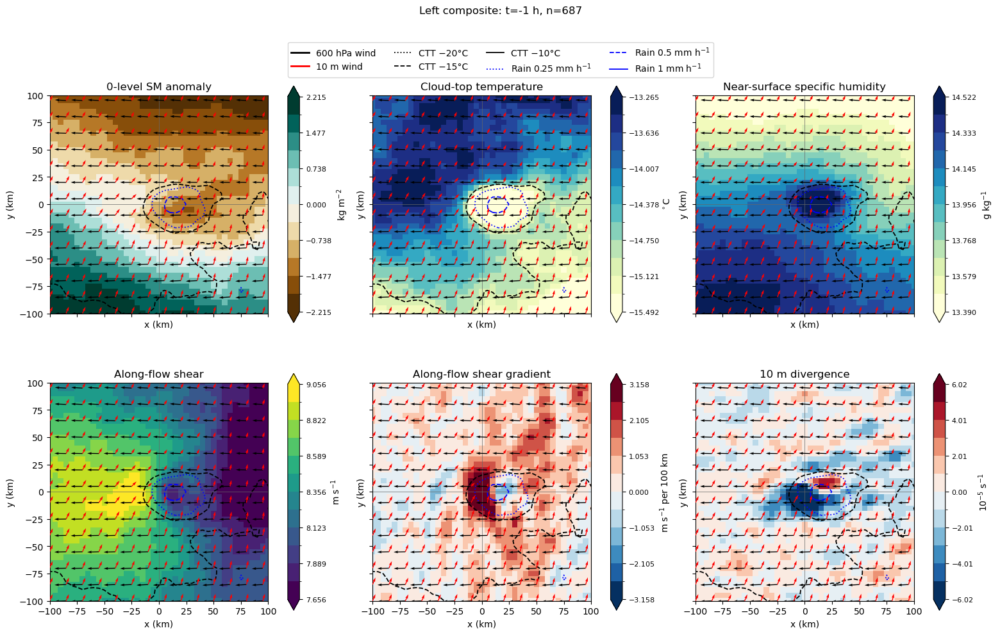

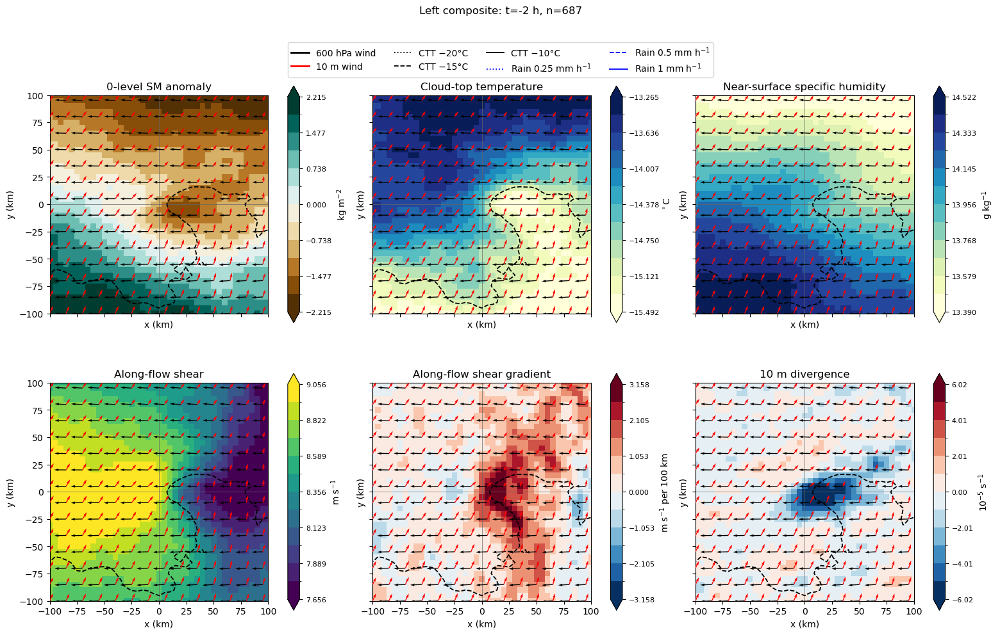

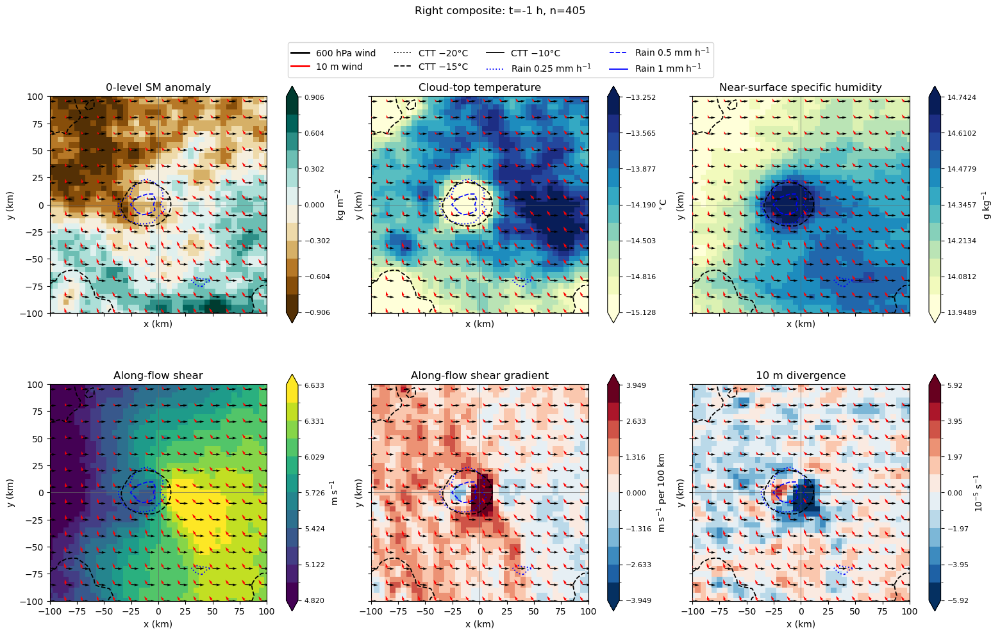

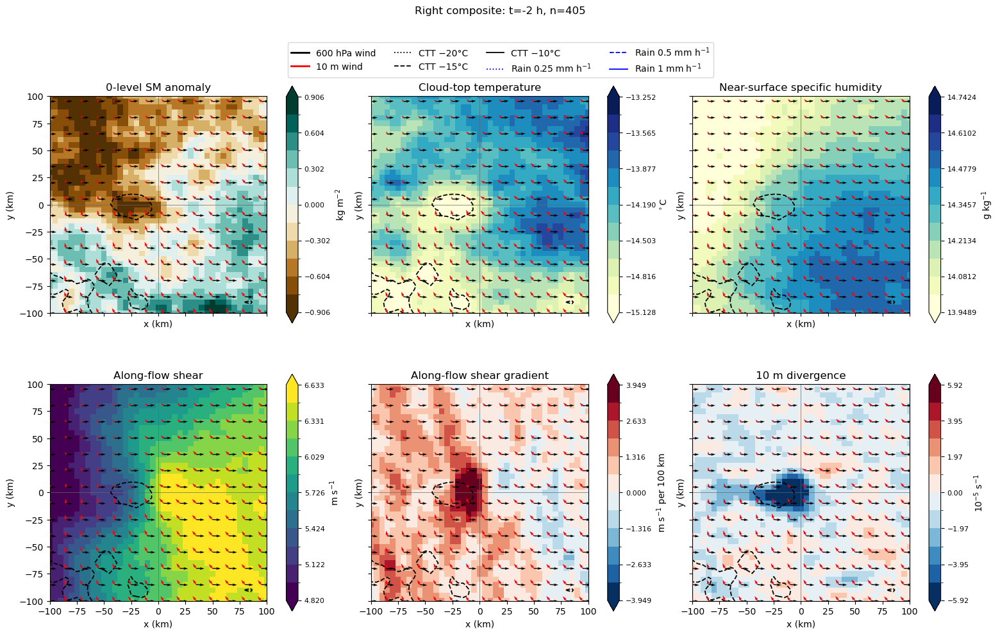

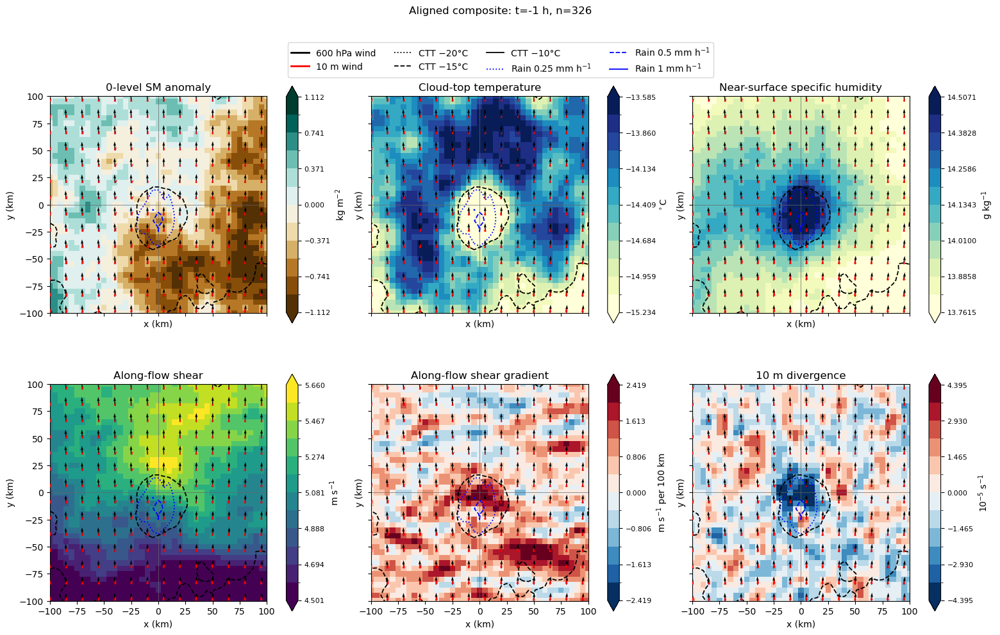

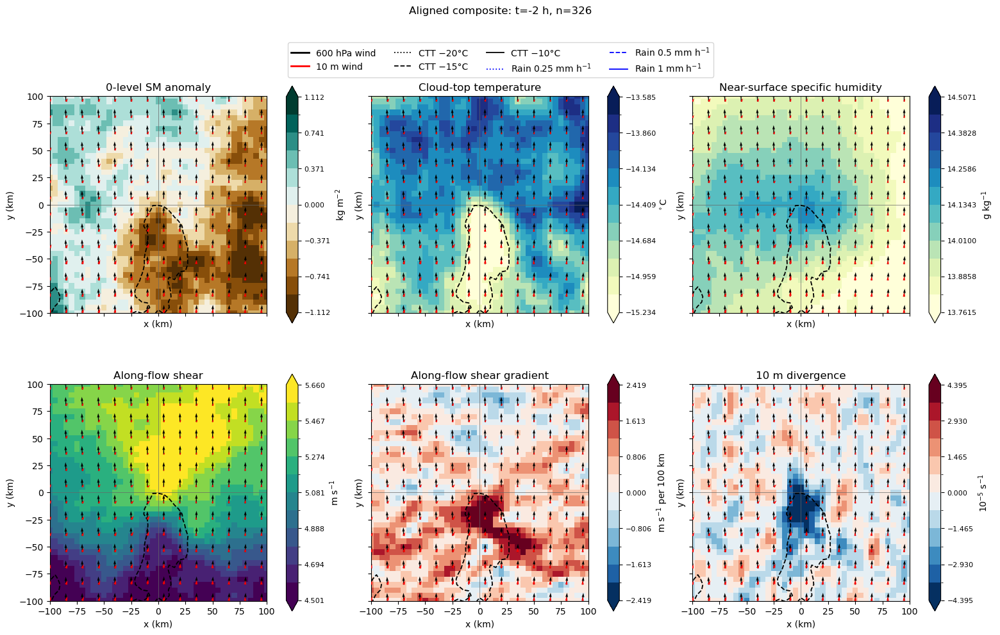

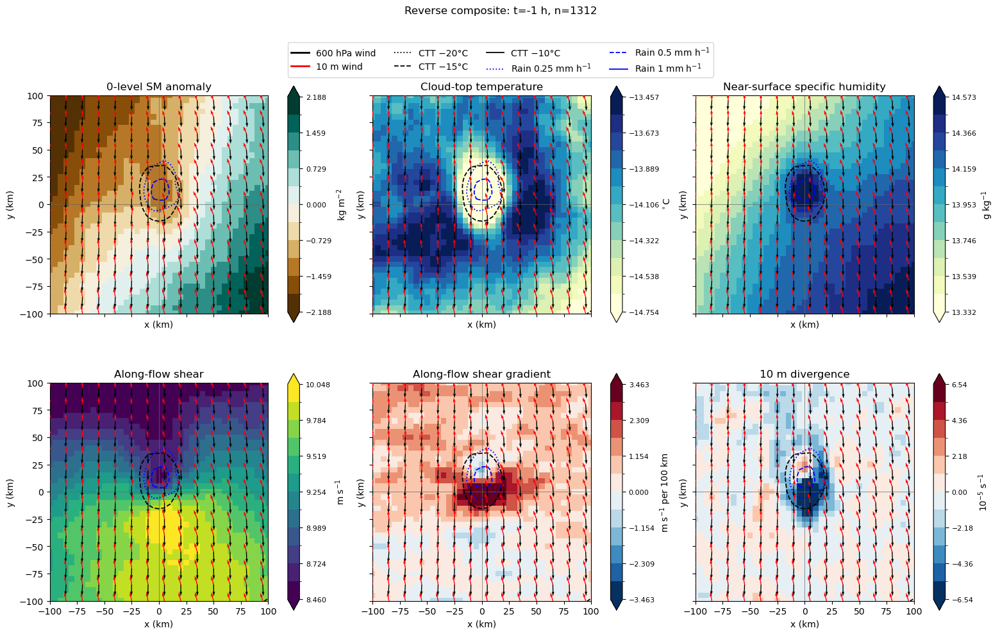

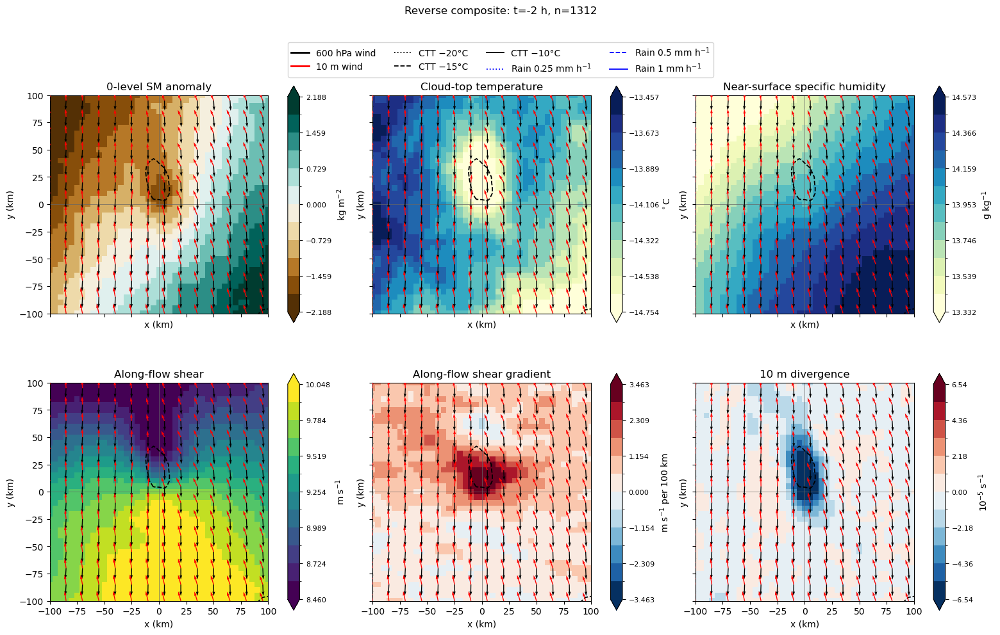

(<Figure size 1550x900 with 12 Axes>,
 array([[<Axes: title={'center': '0-level SM anomaly'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': 'Cloud-top temperature'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': 'Near-surface specific humidity'}, xlabel='x (km)', ylabel='y (km)'>],
        [<Axes: title={'center': 'Along-flow shear'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': 'Along-flow shear gradient'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': '10 m divergence'}, xlabel='x (km)', ylabel='y (km)'>]],
       dtype=object))

In [8]:
plotting('left', -1)
plotting('left', -2)
plotting('right', -1)
plotting('right', -2)
plotting('aligned', -1)
plotting('aligned', -2)
plotting('reverse', -1)
plotting('reverse', -2)

In [9]:
def calculate_lag_difference(direction, pair=None):
    """
    Calculate t=-1 minus t=-2.

    Positive values mean that the variable became more positive
    between t=-2 and t=-1.
    """
    if pair is None:
        pair = prepare_lag_pair(direction)

    difference = {
        variable: pair[-1]['fields'][variable] -
                  pair[-2]['fields'][variable]
        for variable, *_ in PLOT_FIELDS
    }

    return difference, pair


def plot_difference(direction, pair=None, show_tminus1_context=True):
    """Plot the t=-1 minus t=-2 changes."""
    difference, pair = calculate_lag_difference(direction, pair)

    X = pair[-1]['X']
    Y = pair[-1]['Y']

    plot_box = (
        (np.abs(X) <= PLOT_HALF_WIDTH_KM) &
        (np.abs(Y) <= PLOT_HALF_WIDTH_KM)
    )

    fig, axes = plt.subplots(
        2, 3, figsize=(15.5, 9),
        constrained_layout=True,
        sharex=True,
        sharey=True
    )

    for ax, (variable, title, _, unit, _) in zip(
        axes.flat, PLOT_FIELDS
    ):
        data = difference[variable]
        scale_data = data[plot_box & np.isfinite(data)]

        limit = np.nanpercentile(np.abs(scale_data), 99)
        limit = max(limit, np.finfo(float).eps)
        levels = np.linspace(
            -limit, limit, N_COLOUR_BINS + 1
        )

        discrete_cmap = plt.get_cmap('RdBu_r', N_COLOUR_BINS)
        norm = BoundaryNorm(
            levels,
            ncolors=discrete_cmap.N,
            clip=False
        )

        shading = ax.pcolormesh(
            X, Y, data,
            cmap=discrete_cmap,
            norm=norm,
            shading='auto'
        )

        # Optional t=-1 contours and absolute winds for context
        if show_tminus1_context:
            add_context_overlays(ax, pair[-1], step=3)

        format_panel(ax, f'Change in {title}')
        add_colourbar(fig, ax, shading, levels, unit)

    if show_tminus1_context:
        make_legend(fig, contour_prefix='t=−1: ')

    n_m2 = pair[-2]['n_cases']
    n_m1 = pair[-1]['n_cases']

    fig.suptitle(
        f'{direction.capitalize()}: t=−1 minus t=−2 '
        f'(n−2={n_m2}, n−1={n_m1})',
        y=1.095
    )

    output_file = (
        OUTPUT_ROOT /
        f'composite_{direction}_difference_m1_minus_m2.jpg'
    )

    fig.savefig(output_file, dpi=200, bbox_inches='tight')
    plt.show()

    return fig, axes, difference

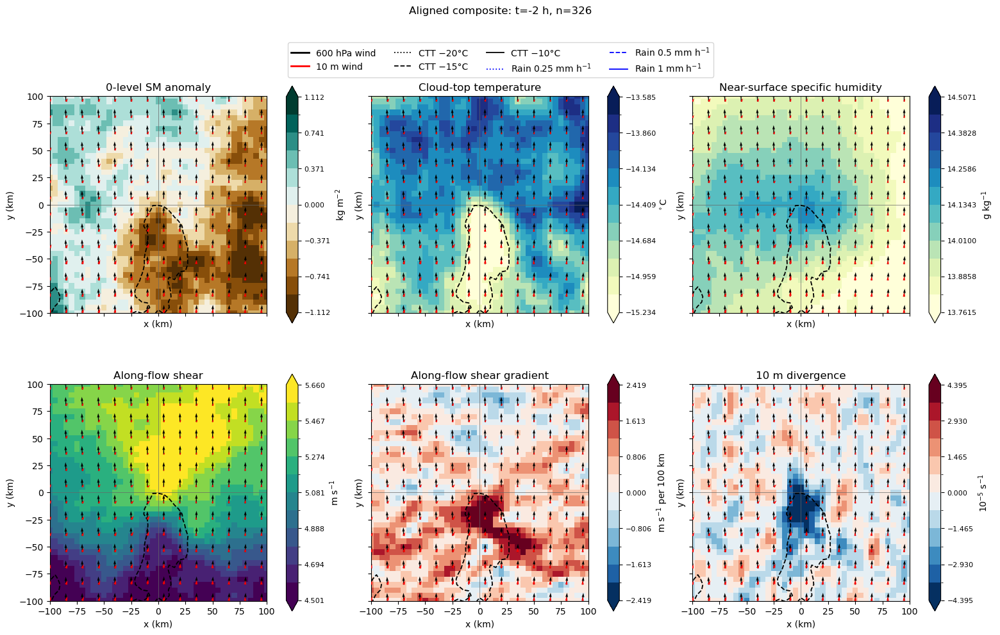

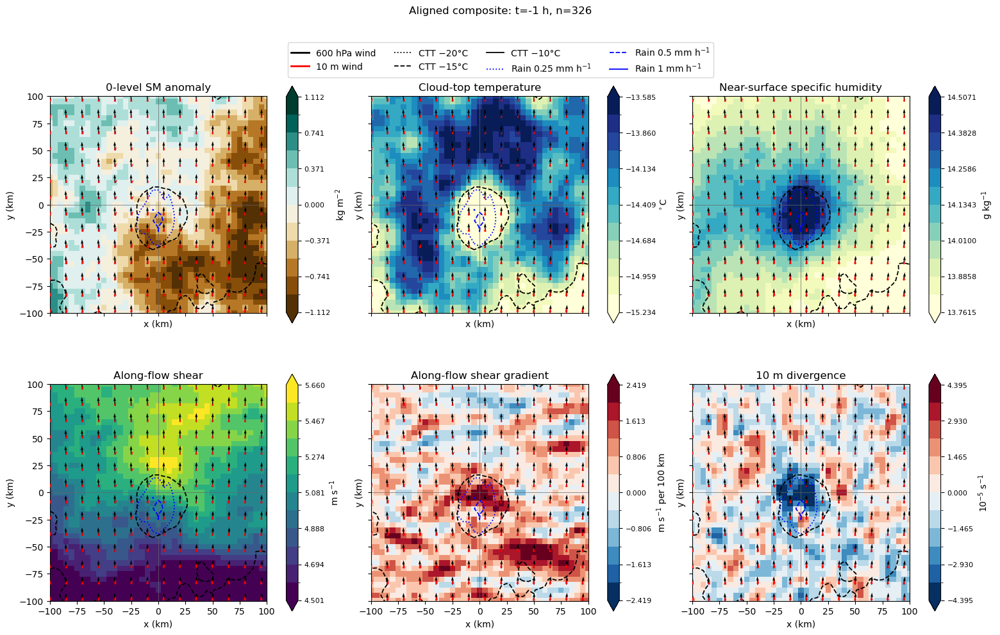

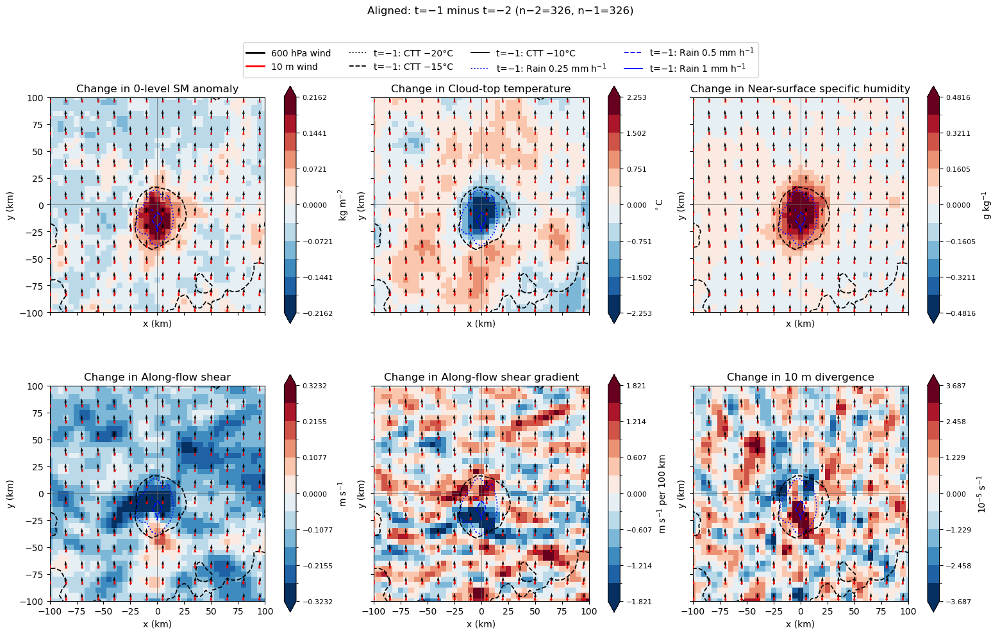

In [11]:
direction = 'aligned'

# Load both lag composites once
pair = prepare_lag_pair(direction)

# These two figures have identical colour-bar ranges
plotting(direction, -2, pair=pair)
plotting(direction, -1, pair=pair)

# Difference is always t=-1 minus t=-2
fig, axes, difference = plot_difference(
    direction,
    pair=pair,
    show_tminus1_context=True
)

In [99]:
from pathlib import Path

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import BoundaryNorm


def plotting(direction, lag):
    # ------------------------------------------------------------
    # Settings
    # ------------------------------------------------------------
    DIRECTION = direction       # aligned, right, reverse or left
    LAG = lag                   # -2 or -1
    PLOT_HALF_WIDTH_KM = 100    # ±100 km = 200 × 200 km
    N_COLOUR_BINS = 12

    CTT_LEVELS = [-30, -20, -10]  # °C
    RAIN_LEVELS = [0.5, 1, 5]     # mm h-1

    OUTPUT_ROOT = Path(
        '/gws/ssde/j25b/kscale/USERS/cklein/umbrella/full_composites'
    )

    # ------------------------------------------------------------
    # Locate NetCDF file
    # ------------------------------------------------------------
    lag_tag = f'lag_{LAG:+d}h'.replace('+', 'p').replace('-', 'm')
    nc_file = OUTPUT_ROOT / lag_tag / f'umbrella_CI_composites_{lag_tag}.nc'

    # ------------------------------------------------------------
    # Read selected directional composite
    # ------------------------------------------------------------
    with xr.open_dataset(nc_file) as ds:
        available = [str(value) for value in ds['category'].values]

        if DIRECTION not in available:
            raise ValueError(
                f'DIRECTION must be one of {available}; '
                f'got {DIRECTION!r}'
            )

        composite = ds.sel(category=DIRECTION).load()

    # ------------------------------------------------------------
    # Coordinates
    # ------------------------------------------------------------
    x = composite['x_km'].values
    y = composite['y_km'].values
    X, Y = np.meshgrid(x, y)

    # ------------------------------------------------------------
    # Extract fields
    # ------------------------------------------------------------
    rain = composite['rain'].values

    u10 = composite['u10'].values
    v10 = composite['v10'].values
    u600 = composite['u600'].values
    v600 = composite['v600'].values

    n_cases = int(composite['n_cases'].item())

    # ------------------------------------------------------------
    # Effective cloud-top temperature from composite-mean OLR
    # ------------------------------------------------------------
    sigma = 5.670374419e-8  # W m-2 K-4
    olr = composite['olr'].values

    ctt = np.full_like(olr, np.nan, dtype=float)
    valid = np.isfinite(olr) & (olr > 0)

    ctt[valid] = (
        (olr[valid] / sigma)**0.25
        - 273.15
    )

    # ------------------------------------------------------------
    # Signed total shear
    #
    # Magnitude uses the full u-v shear vector.
    # Sign indicates whether that vector points with or against the
    # prescribed cloud-movement direction.
    # ------------------------------------------------------------
    shear_u = composite['shear_u'].values  # u600 - u10
    shear_v = composite['shear_v'].values  # v600 - v10

    # This was calculated case by case before compositing
    shear_magnitude = composite['shear'].values

    movement_vectors = {
        'aligned': (0, 1),    # upward
        'reverse': (0, -1),   # downward
        'right': (1, 0),      # rightward
        'left': (-1, 0),      # leftward
    }

    move_x, move_y = movement_vectors[DIRECTION]

    # Projection determines only the sign, not the magnitude
    shear_projection = (
        shear_u * move_x
        + shear_v * move_y
    )

    shear_sign = np.where(
        shear_projection >= 0,
        1.0,
        -1.0
    )

    signed_total_shear = (
        shear_magnitude
        * shear_sign
    )

    # ------------------------------------------------------------
    # Gradient of signed total shear along cloud movement
    #
    # np.gradient returns dS/dy followed by dS/dx.
    # x and y are in km.
    # ------------------------------------------------------------
    dS_dy, dS_dx = np.gradient(
        signed_total_shear,
        y,
        x,
        edge_order=2
    )

    signed_shear_gradient = (
        move_x * dS_dx
        + move_y * dS_dy
    )

    # Convert from m s-1 km-1 to m s-1 per 100 km
    signed_shear_gradient *= 100


    ##########################

        # Low-level wind relative to the assumed cloud motion
    u_rel = u10 - u600
    v_rel = v10 - v600
    
    # Mean total shear magnitude already saved in the composite
    shear_speed = composite['shear'].values
    
    # Spatial gradient in metres
    dS_dy, dS_dx = np.gradient(
        shear_speed,
        y * 1000,
        x * 1000,
        edge_order=2
    )
    
    # Change in total shear speed following the actual tilted inflow
    speed_accel = (
        u_rel * dS_dx +
        v_rel * dS_dy
    )
    
    # Scale for plotting
    speed_accel_plot = speed_accel * 1e4

    # ------------------------------------------------------------
    # Fields to plot
    # ------------------------------------------------------------
    fields = {
        'sm_anomaly': composite['sm_anomaly'].values,
        'ctt': ctt,
        'q_low': composite['q_low'].values,
        'shear': speed_accel_plot,#signed_total_shear,
        'shear_gradient': signed_shear_gradient,
        'div10': composite['div10'].values * 1e5,
    }

    # ------------------------------------------------------------
    # Displayed 200 × 200 km region
    # ------------------------------------------------------------
    plot_box = (
        (np.abs(X) <= PLOT_HALF_WIDTH_KM)
        & (np.abs(Y) <= PLOT_HALF_WIDTH_KM)
    )

    plot_fields = [
        (
            'sm_anomaly',
            'Top-layer SM anomaly',
            'BrBG',
            r'kg m$^{-2}$',
            True
        ),
        (
            'ctt',
            'Cloud-top temperature',
            'YlGnBu',
            r'$^\circ$C',
            False
        ),
        (
            'q_low',
            'Near-surface specific humidity',
            'YlGnBu',
            r'g kg$^{-1}$',
            False
        ),
        (
            'shear',
            'Signed total 600 hPa–10 m shear',
            'RdBu_r',
            r'm s$^{-1}$',
            False
        ),
        (
            'shear_gradient',
            'Along-motion total-shear gradient',
            'RdBu_r',
            r'm s$^{-1}$ per 100 km',
            True
        ),
        (
            'div10',
            '10 m divergence',
            'RdBu_r',
            r'$10^{-5}$ s$^{-1}$',
            True
        ),
    ]

    # ------------------------------------------------------------
    # Create figure
    # ------------------------------------------------------------
    fig, axes = plt.subplots(
        2,
        3,
        figsize=(15.5, 9),
        constrained_layout=True,
        sharex=True,
        sharey=True
    )

    step = 3

    for ax, (variable, title, cmap, unit, symmetric) in zip(
        axes.flat,
        plot_fields
    ):
        data = fields[variable]

        scale_data = data[
            plot_box & np.isfinite(data)
        ]

        if scale_data.size == 0:
            raise ValueError(
                f'No finite {variable} values '
                f'inside the plotting region'
            )

        # --------------------------------------------------------
        # Create 12 discrete colour intervals
        # --------------------------------------------------------
        if symmetric:
            limit = np.nanpercentile(
                np.abs(scale_data),
                99
            )

            if not np.isfinite(limit) or limit == 0:
                limit = 1

            levels = np.linspace(
                -limit,
                limit,
                N_COLOUR_BINS + 1
            )

        else:
            vmin, vmax = np.nanpercentile(
                scale_data,
                [5, 99]
            )

            if np.isclose(vmin, vmax):
                vmax = vmin + 1

            levels = np.linspace(
                vmin,
                vmax,
                N_COLOUR_BINS + 1
            )

        discrete_cmap = plt.get_cmap(
            cmap,
            N_COLOUR_BINS
        )

        norm = BoundaryNorm(
            levels,
            ncolors=discrete_cmap.N,
            clip=False
        )

        shading = ax.pcolormesh(
            X,
            Y,
            data,
            cmap=discrete_cmap,
            norm=norm,
            shading='auto'
        )

        # --------------------------------------------------------
        # Cloud-top-temperature contours
        # --------------------------------------------------------
        ctt_contours = ax.contour(
            X,
            Y,
            ctt,
            levels=CTT_LEVELS,
            colors='black',
            linestyles=[':', '--', '-'],
            linewidths=1.3,
            zorder=3
        )

        ax.clabel(
            ctt_contours,
            fmt={
                -30: '−30',
                -20: '−20',
                -10: '−10'
            },
            fontsize=8,
            inline=True
        )

        # --------------------------------------------------------
        # Rainfall contours
        # --------------------------------------------------------
        rain_contours = ax.contour(
            X,
            Y,
            rain,
            levels=RAIN_LEVELS,
            colors='blue',
            linestyles=[':', '--', '-'],
            linewidths=1.3,
            zorder=3
        )

        ax.clabel(
            rain_contours,
            fmt={
                0.5: '0.5',
                1: '1',
                5: '5'
            },
            fontsize=8,
            inline=True
        )

        # --------------------------------------------------------
        # Rotated 600 hPa wind vectors
        # --------------------------------------------------------
        ax.quiver(
            X[::step, ::step],
            Y[::step, ::step],
            u600[::step, ::step],
            v600[::step, ::step],
            color='black',
            scale=150,
            width=0.004,
            zorder=4
        )

        # --------------------------------------------------------
        # Rotated 10 m wind vectors
        # --------------------------------------------------------
        ax.quiver(
            X[::step, ::step],
            Y[::step, ::step],
            u10[::step, ::step],
            v10[::step, ::step],
            color='red',
            scale=50,
            width=0.004,
            zorder=4
        )

        # ax.quiver(
        #     X[::step, ::step], Y[::step, ::step],
        #     u_rel[::step, ::step], v_rel[::step, ::step],
        #     color='turquoise', scale=150, width=0.0035, zorder=5
        # )

        ax.axhline(
            0,
            color='0.4',
            lw=0.5
        )

        ax.axvline(
            0,
            color='0.4',
            lw=0.5
        )

        ax.set(
            title=title,
            xlabel='x (km)',
            ylabel='y (km)',
            xlim=(
                -PLOT_HALF_WIDTH_KM,
                PLOT_HALF_WIDTH_KM
            ),
            ylim=(
                -PLOT_HALF_WIDTH_KM,
                PLOT_HALF_WIDTH_KM
            ),
            aspect='equal'
        )

        # --------------------------------------------------------
        # Discrete colour bar
        # --------------------------------------------------------
        cbar = fig.colorbar(
            shading,
            ax=ax,
            boundaries=levels,
            ticks=levels[::2],
            spacing='uniform',
            extend='both',
            shrink=0.84
        )

        cbar.set_label(unit)
        cbar.ax.tick_params(labelsize=8)

    # ------------------------------------------------------------
    # Figure legend
    # ------------------------------------------------------------
    handles = [
        Line2D(
            [0], [0],
            color='black',
            lw=2,
            label='600 hPa wind'
        ),
        Line2D(
            [0], [0],
            color='red',
            lw=2,
            label='10 m wind'
        ),
        Line2D(
            [0], [0],
            color='black',
            lw=1.3,
            ls=':',
            label='CTT −30°C'
        ),
        Line2D(
            [0], [0],
            color='black',
            lw=1.3,
            ls='--',
            label='CTT −20°C'
        ),
        Line2D(
            [0], [0],
            color='black',
            lw=1.3,
            ls='-',
            label='CTT −10°C'
        ),
        Line2D(
            [0], [0],
            color='blue',
            lw=1.3,
            ls=':',
            label='Rain 0.5 mm h$^{-1}$'
        ),
        Line2D(
            [0], [0],
            color='blue',
            lw=1.3,
            ls='--',
            label='Rain 1 mm h$^{-1}$'
        ),
        Line2D(
            [0], [0],
            color='blue',
            lw=1.3,
            ls='-',
            label='Rain 5 mm h$^{-1}$'
        ),
    ]

    fig.legend(
        handles=handles,
        loc='upper center',
        ncol=4,
        bbox_to_anchor=(0.5, 1.04)
    )

    fig.suptitle(
        f'{DIRECTION.capitalize()} composite: '
        f't={LAG:+d} h, n={n_cases}',
        y=1.095
    )

    # ------------------------------------------------------------
    # Save and display
    # ------------------------------------------------------------
    output_file = (
        OUTPUT_ROOT
        / lag_tag
        / f'composite_{DIRECTION}_{lag_tag}_totalShear.jpg'
    )

    fig.savefig(
        output_file,
        dpi=200,
        bbox_inches='tight'
    )

    plt.show()

    return fig, axes

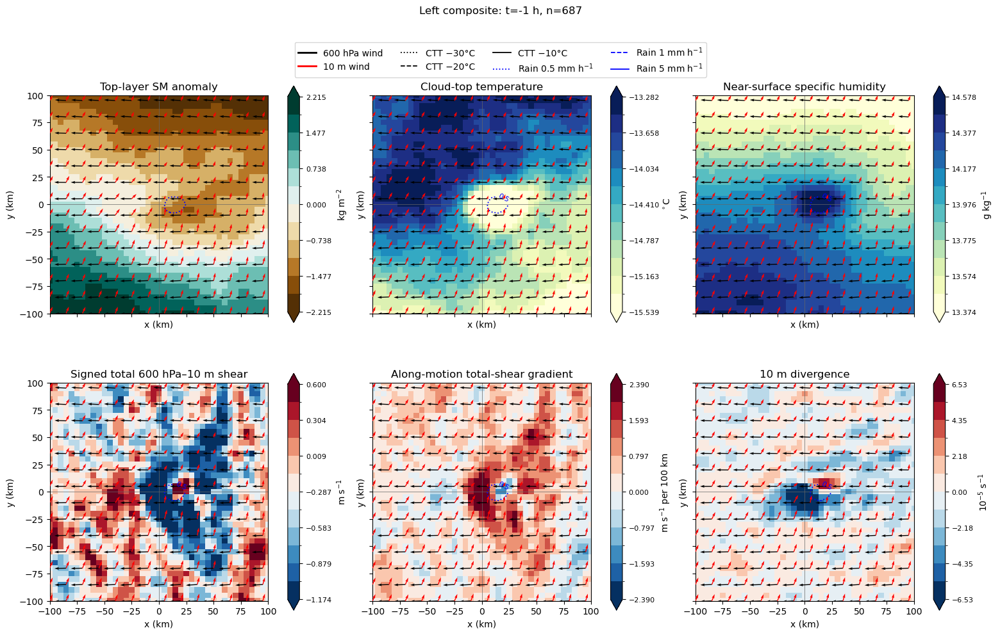

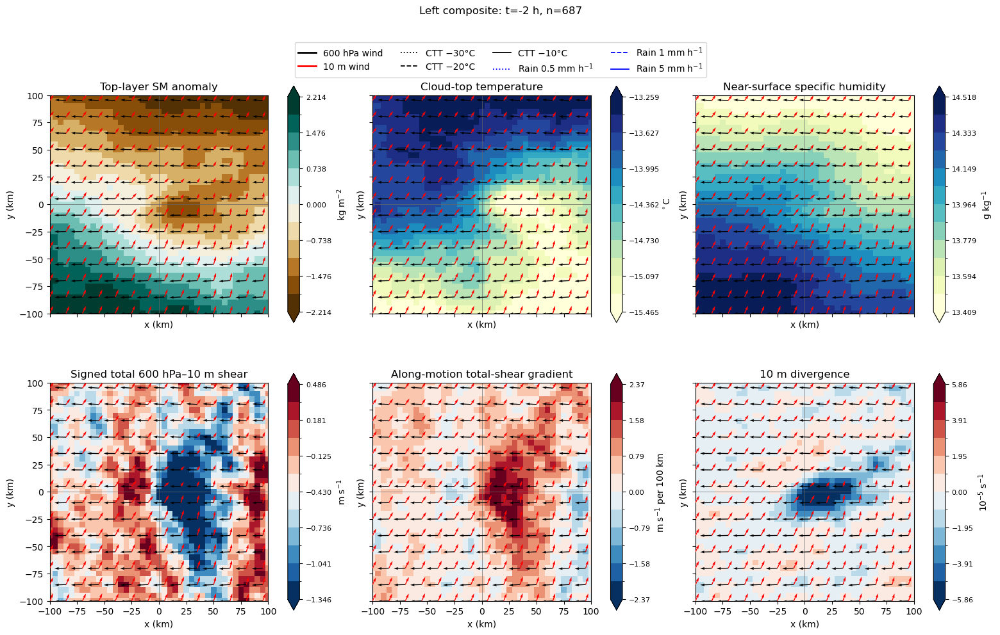

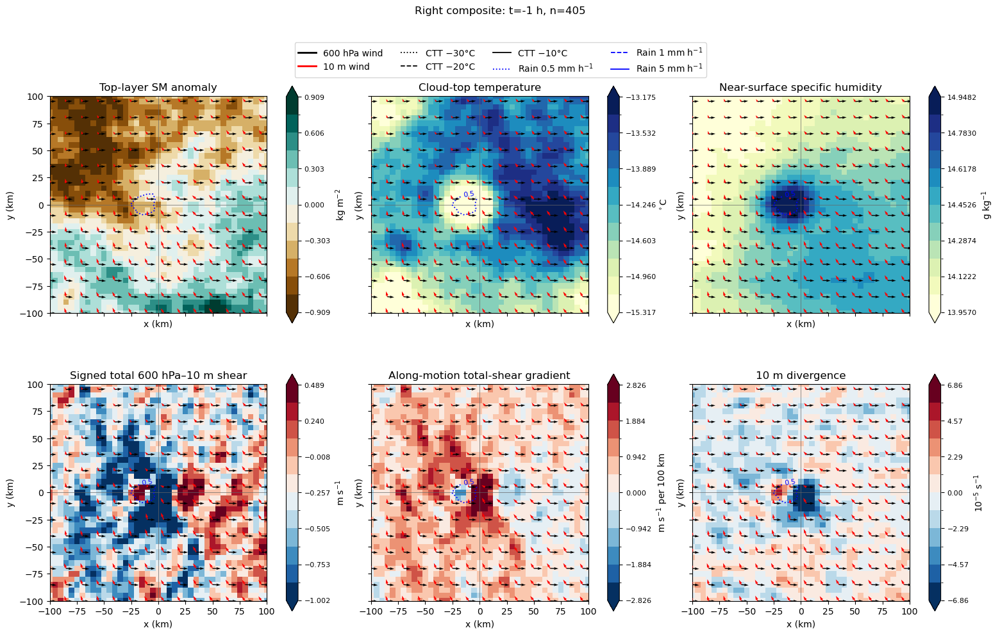

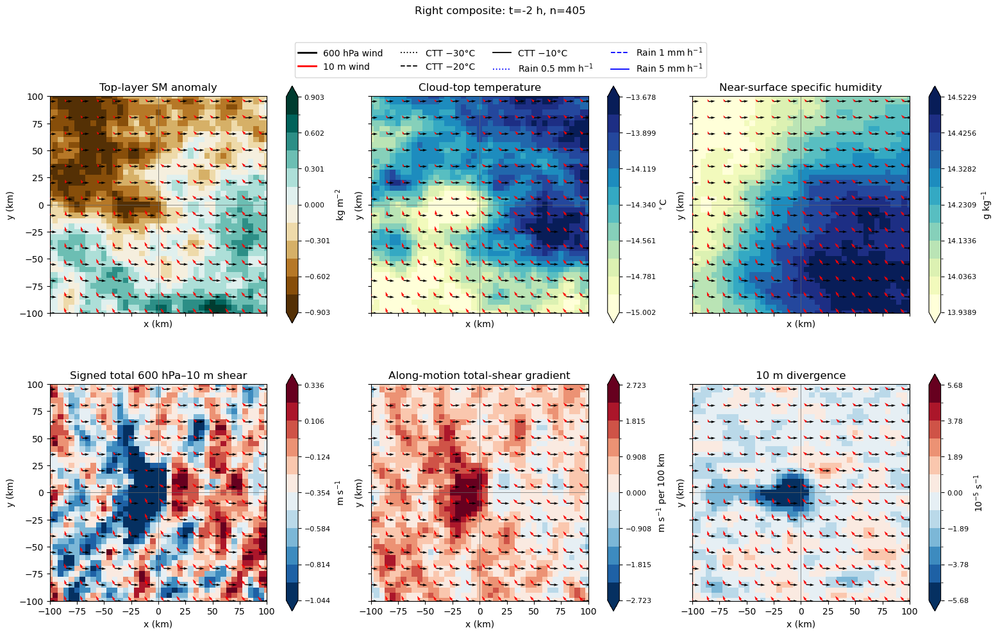

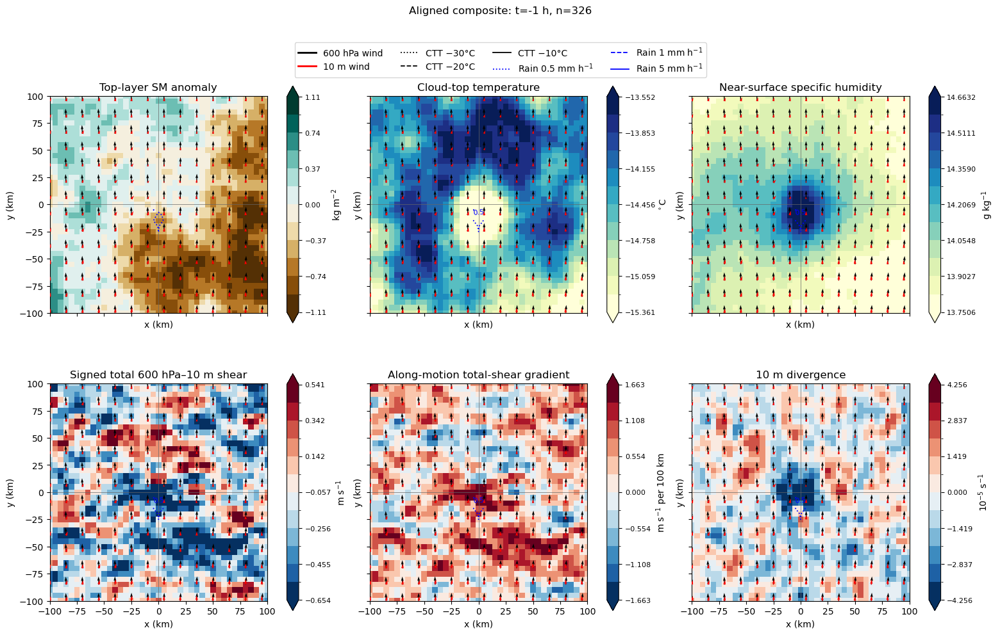

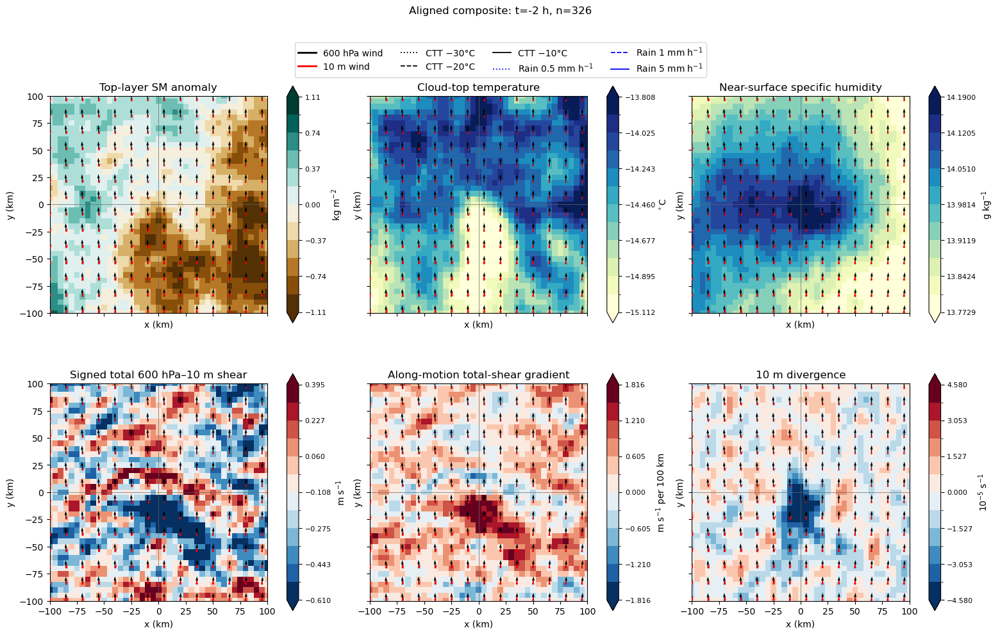

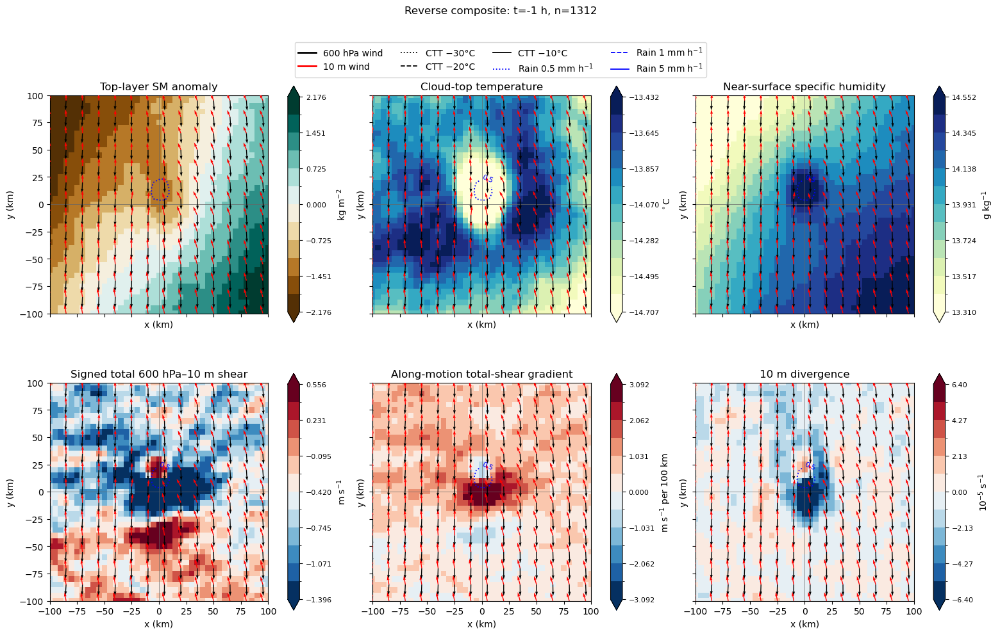

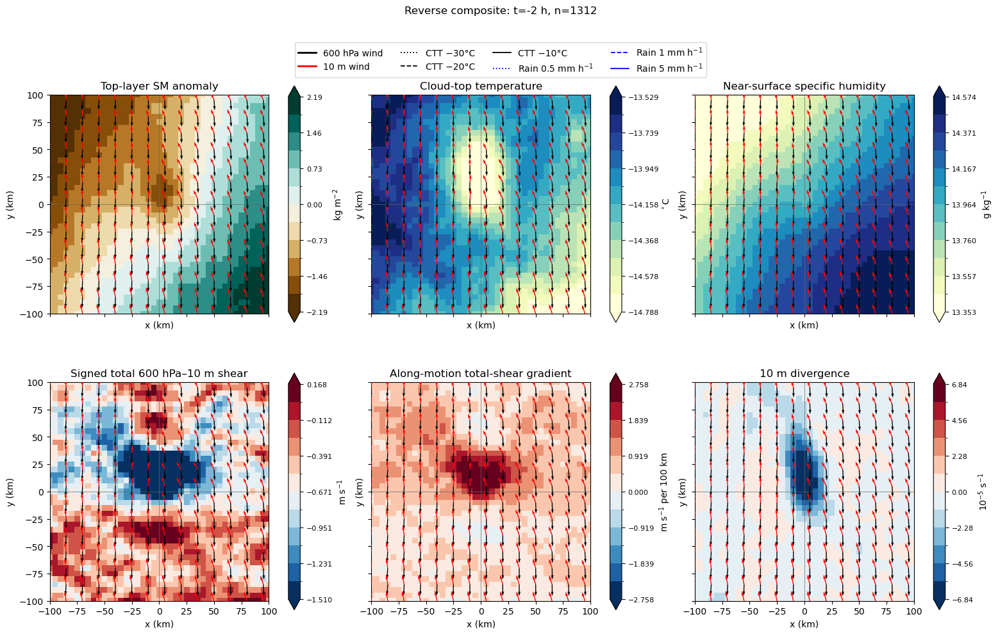

(<Figure size 1550x900 with 12 Axes>,
 array([[<Axes: title={'center': 'Top-layer SM anomaly'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': 'Cloud-top temperature'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': 'Near-surface specific humidity'}, xlabel='x (km)', ylabel='y (km)'>],
        [<Axes: title={'center': 'Signed total 600 hPa–10 m shear'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': 'Along-motion total-shear gradient'}, xlabel='x (km)', ylabel='y (km)'>,
         <Axes: title={'center': '10 m divergence'}, xlabel='x (km)', ylabel='y (km)'>]],
       dtype=object))

In [100]:
plotting('left', -1)
plotting('left', -2)
plotting('right', -1)
plotting('right', -2)
plotting('aligned', -1)
plotting('aligned', -2)
plotting('reverse', -1)
plotting('reverse', -2)